In [5]:
import os

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.utils import Sequence
import cv2

from diode import DIODE


data_set_folder = "/train/"
split = 'train'
scene_type =  'indoors'
meta_fname = './diode_meta.json'
data_root = '/home/colin/projects/QMIND-CV-Robot-Vision/depth-map-project'
diode = DIODE(splits=split, scene_types=scene_type, meta_fname=meta_fname, data_root=data_root)

# Ensure annotation folder exists
if not os.path.exists(os.path.abspath(".") + data_set_folder):
    annotation_zip = tf.keras.utils.get_file(
        "train.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/train.tar.gz",
        extract=True,
    )

dim = (256, 256, 3)
tf.random.set_seed(123)



In [6]:
class CustomDataGenerator(Sequence):
    def __init__(self, split, scene_types, meta_fname, data_root, batch_size, dim):
        self.batch_size = batch_size
        self.diode = DIODE(splits=split, scene_types=scene_types, meta_fname=meta_fname, data_root=data_root)
        self.data_size = len(self.diode)
        self.dim = dim

        # not including channels
        self.output_dim = (self.dim[0]//2, self.dim[1]//2)


    def __len__(self):

        return int(np.ceil(len(self.diode) / float(self.batch_size)))


    def __getitem__(self, index):

        load = self.data_generation(index)
        return  load

    def load(self, batch_id):

        x, y, mask = self.diode[batch_id]

        # Preprocessing for x
        x = cv2.resize(x, self.dim[:2])
        x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
        x = tf.image.convert_image_dtype(x, tf.float32)

        # Preprocessing for y
        mask = mask > 0
        max_depth = min(300, np.percentile(y, 99))
        max_depth = max(max_depth, 1)
        y = np.clip(y, 0.1, max_depth)

        # Apply logarithmic transformation and handle inf/nan values
        y = np.log(np.maximum(y, 0.001), where=mask)
        y = np.nan_to_num(y, nan=0.0, posinf=0.0, neginf=0.0)
        y = np.ma.masked_where(~mask, y)
        
        # Clip again after log transformation
        y = np.clip(y, 0.1, np.log(max_depth))

        # Normalize the depth map between 0 and 1
        y_min = y.min()
        y_max = y.max()
        y = (y - y_min) / (y_max - y_min)

        # Resize and expand dimensions
        y = cv2.resize(y, self.output_dim)
        y = np.expand_dims(y, axis=2)
        y = tf.image.convert_image_dtype(y, tf.float32)
        return x, y

    def data_generation(self, index):

        x_batch, y_batch = [], []
        start_index = index * self.batch_size
        end_index = (index + 1) * self.batch_size

        for i in range(start_index, min(end_index + 1, self.data_size)):
            x, y = self.load(i)

            x_batch.append(x)
            y_batch.append(y)
        
            

        x_batch = np.array(x_batch)
        y_batch = np.array(y_batch)


        return x_batch, y_batch


In [7]:

from tensorflow.keras.applications import DenseNet169
from tensorflow.keras.layers import Conv2D, UpSampling2D,  LeakyReLU, Concatenate, BatchNormalization
from tensorflow.keras import Model


class UpSamplingBlock(tf.keras.layers.Layer):
    def __init__(self, filters):
        super(UpSamplingBlock, self).__init__()
        self.up_sampling = UpSampling2D(size=(2,2), interpolation='bilinear')
        self.concat = Concatenate()
        self.convA = Conv2D(filters=filters, kernel_size=(3,3), padding='same')
        self.reluA = LeakyReLU()
        self.batch_normA = BatchNormalization()
        self.convB = Conv2D(filters=filters, kernel_size=(3,3), padding='same')
        self.reluB = LeakyReLU()
        self.batch_normB = BatchNormalization()       
        
    def call(self, input):
        """ input is a 2 element list, first element is the input tensor, second element is the tensor to be concatenated from encoder
        """
        x = self.up_sampling(input[0])
        x = self.concat([x, input[1]])
        x = self.convA(x)
        x = self.reluA(x)
        x = self.batch_normA(x)
        x = self.convB(x)
        x = self.reluB(x)
        x = self.batch_normB(x)
        return x
    

class encoder(tf.keras.layers.Layer):
    def __init__(self, dim):
        super(encoder, self).__init__()
        self.dense_net = DenseNet169(input_shape=(dim[0], dim[1], 3), include_top=False, weights='imagenet') 
        for layer in self.dense_net.layers:
            layer.trainable = True

        dense_net_layer_output_names = ['pool3_pool', 'pool2_pool', 'pool1','conv1/relu']
        outputs = [self.dense_net.output]
        for name in dense_net_layer_output_names:
            outputs.append(self.dense_net.get_layer(name).output)

        self.encoder = Model(inputs=self.dense_net.input, outputs=outputs)


    def call(self, inputs):
        return self.encoder(inputs)
    

class decoder(tf.keras.layers.Layer):
    def __init__(self):
        super(decoder, self).__init__()
        self.covA = Conv2D(filters=1664, kernel_size=(1,1), padding='same')
        self.up_block1 = UpSamplingBlock(filters=832)
        self.up_block2 = UpSamplingBlock(filters=416)
        self.up_block3 = UpSamplingBlock(filters=208)
        self.up_block4 = UpSamplingBlock(filters=104)
        self.covB = Conv2D(filters=1, activation="sigmoid", kernel_size=(3,3), padding='same')

    def call(self, features):
        x = self.covA(features[0])
        x = self.up_block1([x, features[1]])
        x = self.up_block2([x, features[2]])
        x = self.up_block3([x, features[3]])
        x = self.up_block4([x, features[4]])
        x = self.covB(x)
        return x
        

class DepthEstimator(tf.keras.Model):
    def __init__(self, dim):
        super(DepthEstimator, self).__init__()
        self.encoder = encoder(dim)
        self.decoder = decoder()

    def call(self, inputs):
        features = self.encoder(inputs)
        depth = self.decoder(features)
        return depth

In [8]:

import tensorflow_addons as tfa


def loss_function(target, pred):
    
    # Point-wise depth
    depth_loss = tf.reduce_mean(tf.abs(target - pred))

    # Gradient loss
    dy_true, dx_true = tf.image.image_gradients(target)
    dy_pred, dx_pred = tf.image.image_gradients(pred)

    grad_loss = tf.reduce_mean(tf.abs(dy_true - dy_pred) + tf.abs(dx_true - dx_pred))

    # Structural similarity loss
    ssim_loss = tf.reduce_mean(1 - tf.image.ssim(
        target, pred, max_val=dim[0]) / 2
    )

    lambda_value = 0.1
    loss = ssim_loss + lambda_value * depth_loss + grad_loss

    return loss


batch_size = 2
epochs = 10
lr = 0.0001

# Create the model
model = DepthEstimator(dim)
opt = tfa.optimizers.AdamW(learning_rate=lr, weight_decay=1e-6,amsgrad=True)

# Compile the model
model.compile(optimizer=opt, loss=loss_function, metrics=['accuracy'])

custom_data_generator = CustomDataGenerator(split=split, scene_types=scene_type, meta_fname=meta_fname, data_root=data_root, batch_size=batch_size, dim=dim)

model.fit(custom_data_generator,epochs=epochs)




Epoch 1/10
  80/4287 [..............................] - ETA: 9:33 - loss: 0.3095 - accuracy: 0.0585

KeyboardInterrupt: 

1/1 [==============================] - 0s 18ms/step


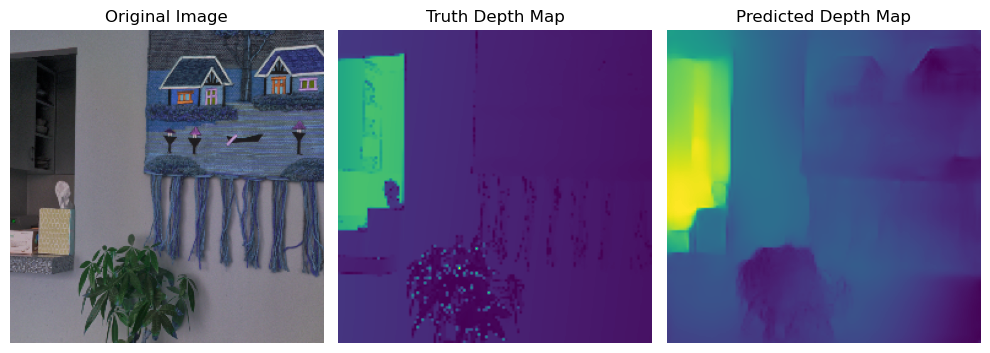

1/1 [==============================] - 0s 22ms/step


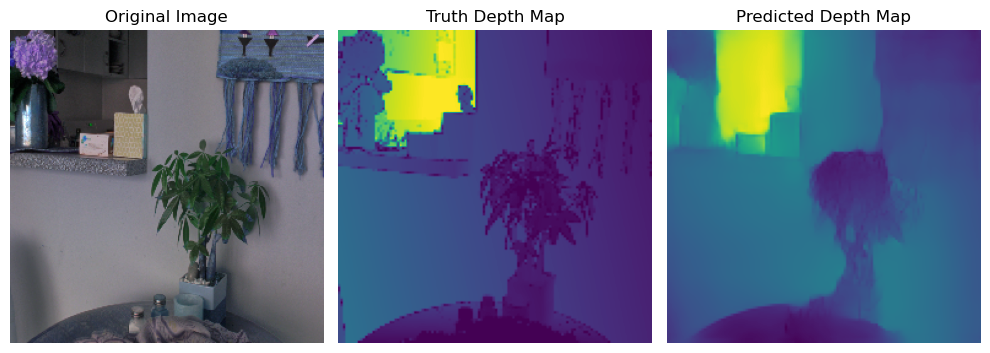

1/1 [==============================] - 0s 15ms/step


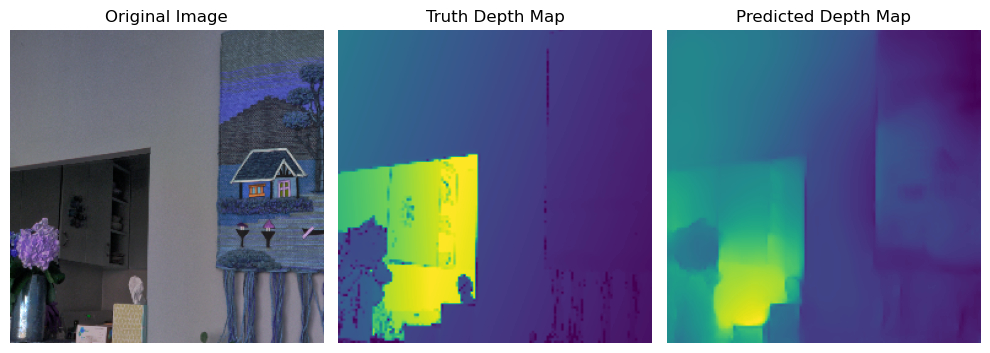

1/1 [==============================] - 0s 15ms/step


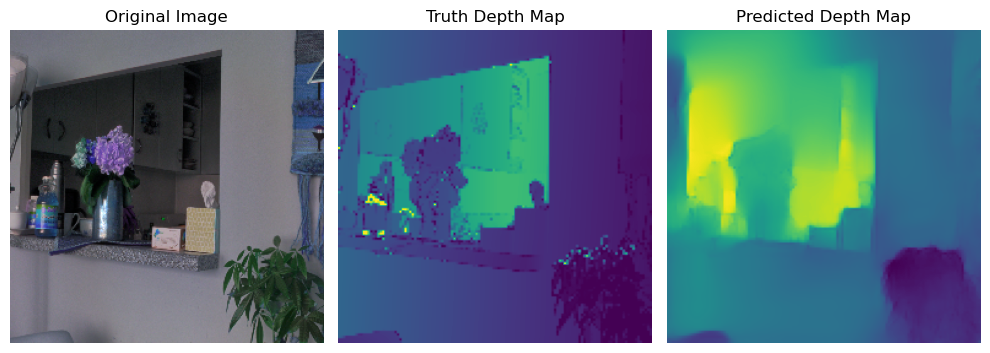

1/1 [==============================] - 0s 15ms/step


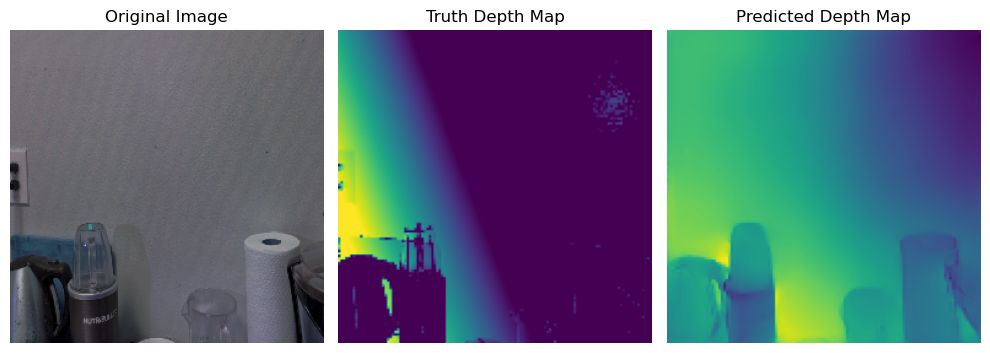

1/1 [==============================] - 0s 15ms/step


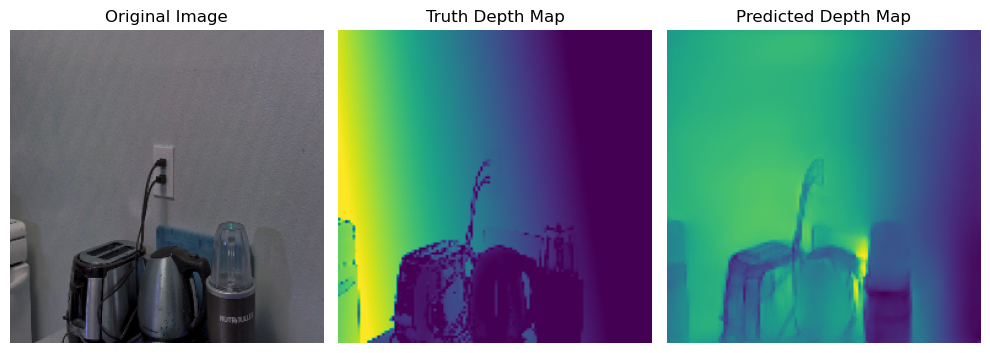

1/1 [==============================] - 0s 15ms/step


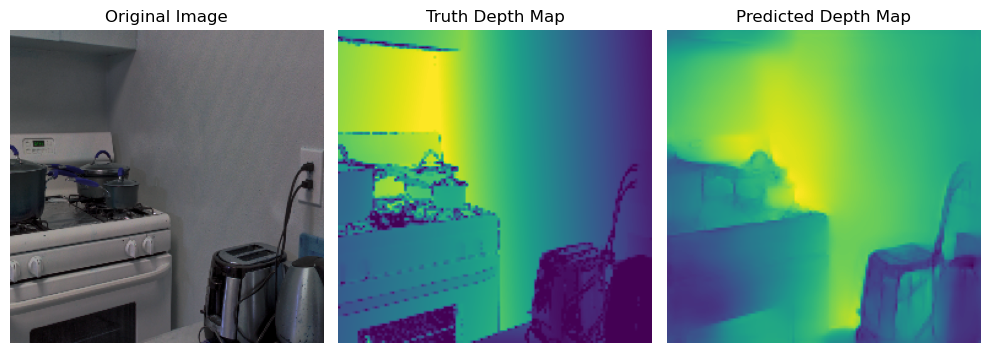

1/1 [==============================] - 0s 17ms/step


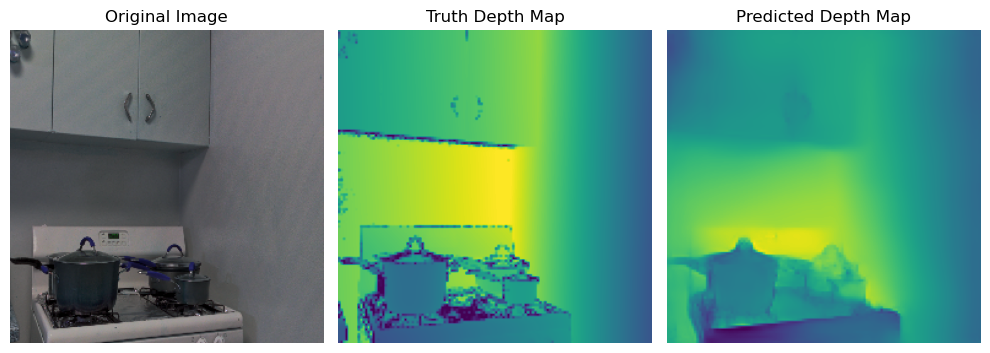

1/1 [==============================] - 0s 15ms/step


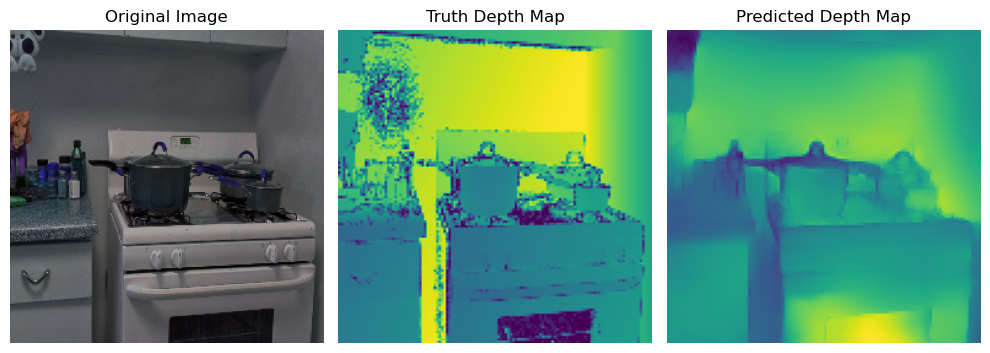

1/1 [==============================] - 0s 15ms/step


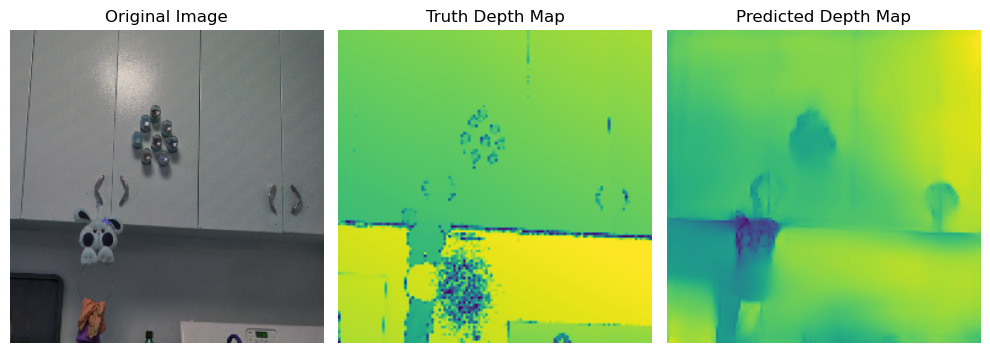

1/1 [==============================] - 0s 15ms/step


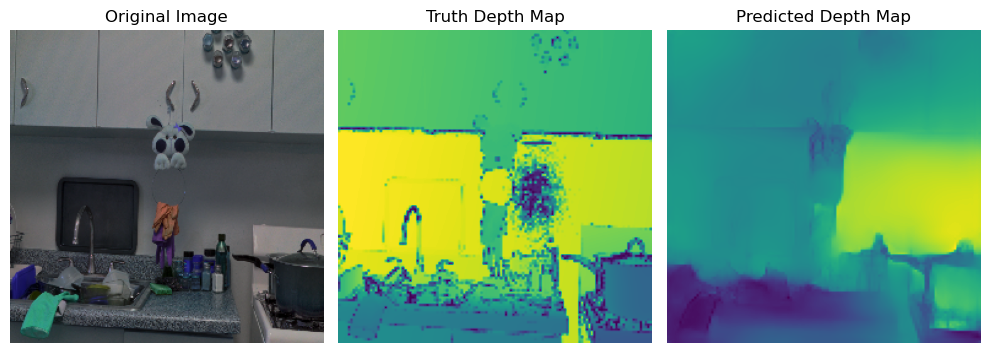

1/1 [==============================] - 0s 15ms/step


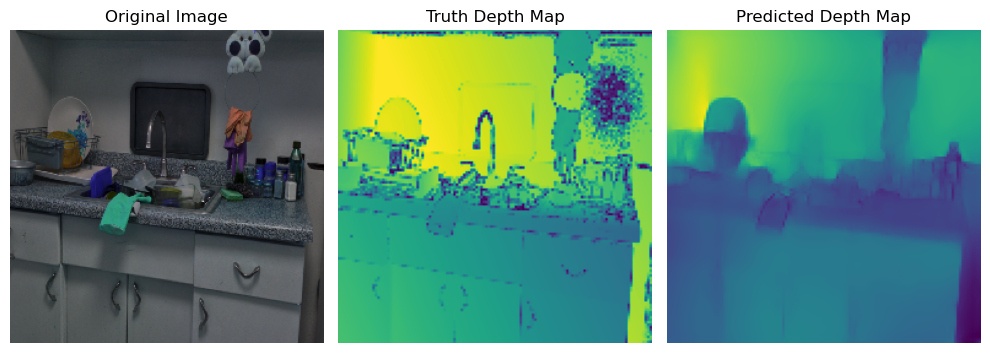

1/1 [==============================] - 0s 15ms/step


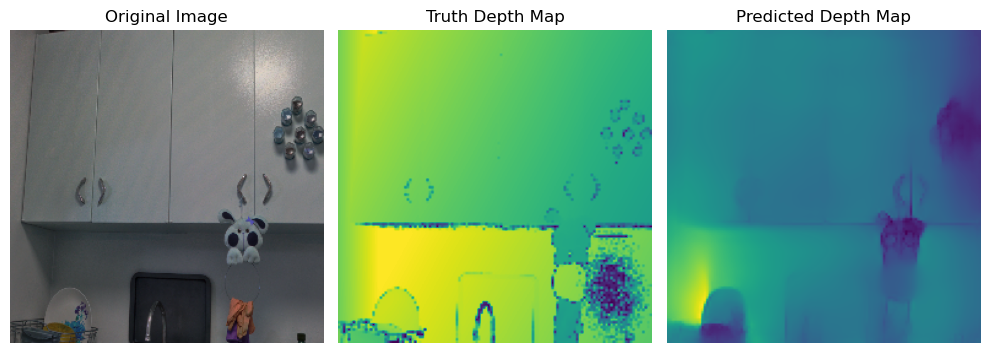

1/1 [==============================] - 0s 22ms/step


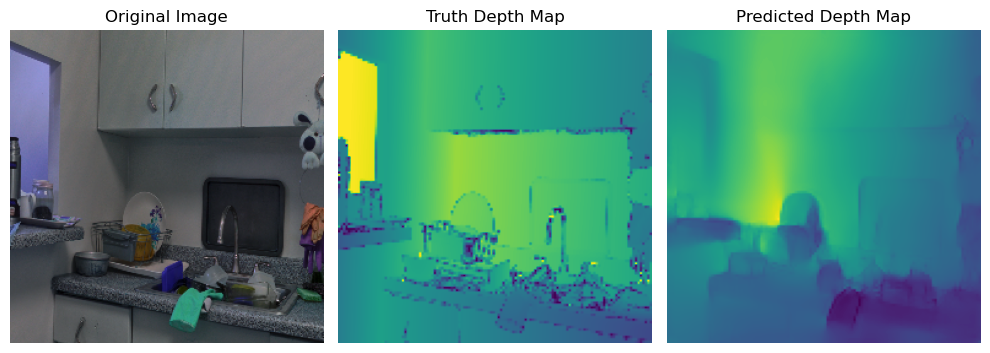

1/1 [==============================] - 0s 209ms/step


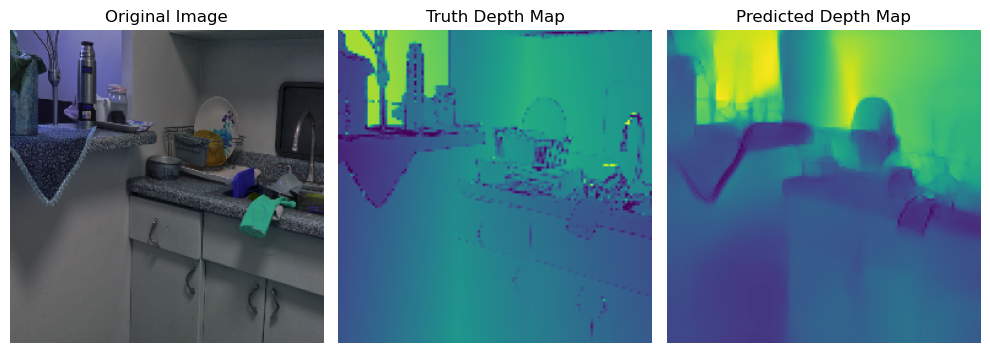

1/1 [==============================] - 0s 16ms/step


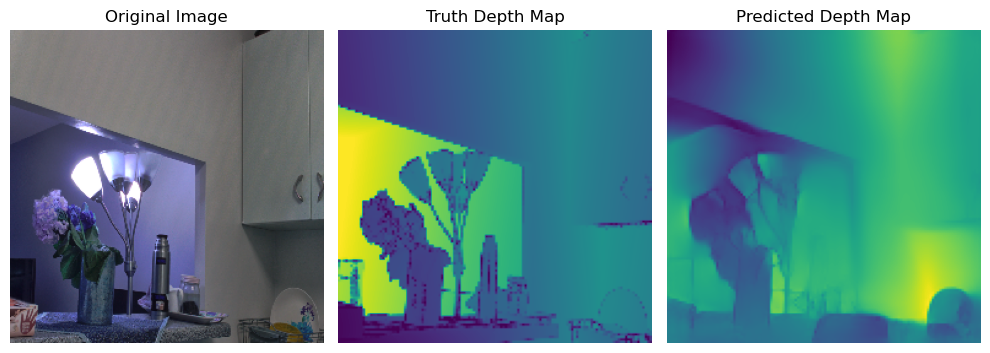

1/1 [==============================] - 0s 18ms/step


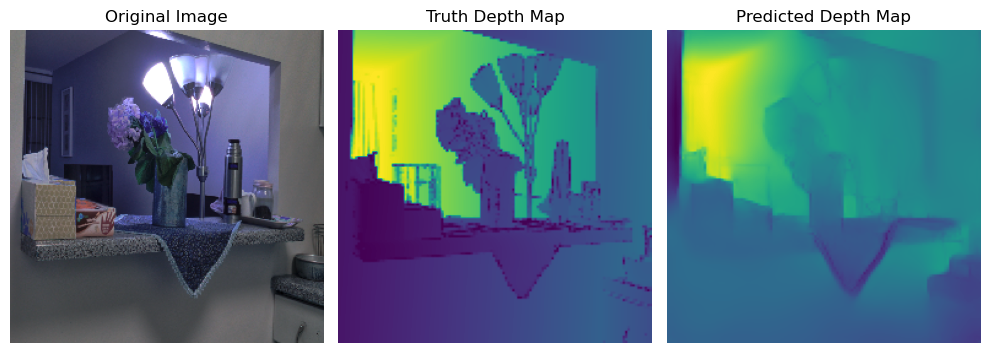

1/1 [==============================] - 0s 20ms/step


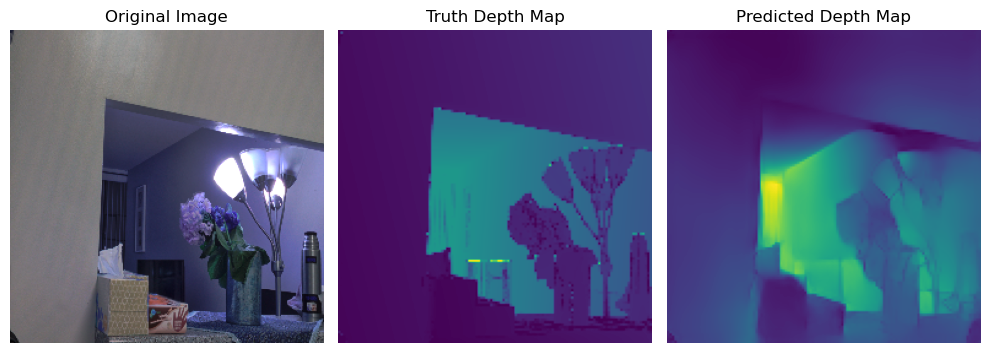

1/1 [==============================] - 0s 17ms/step


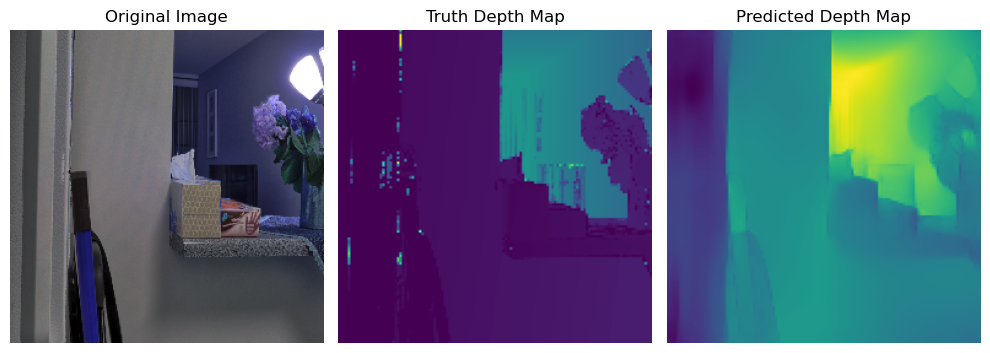

1/1 [==============================] - 0s 15ms/step


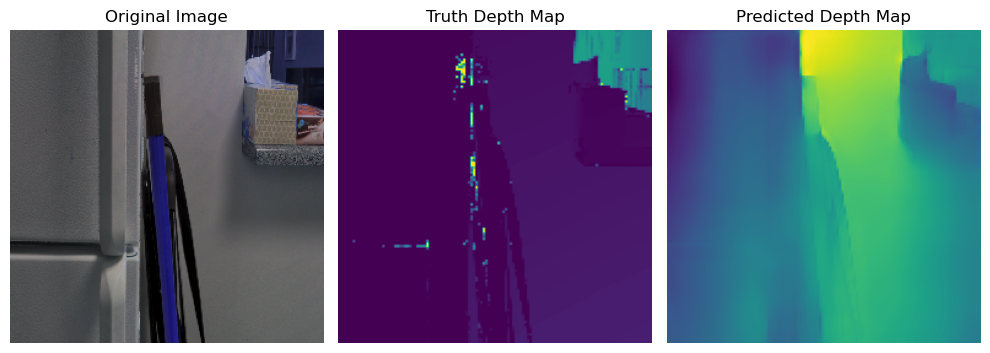

1/1 [==============================] - 0s 15ms/step


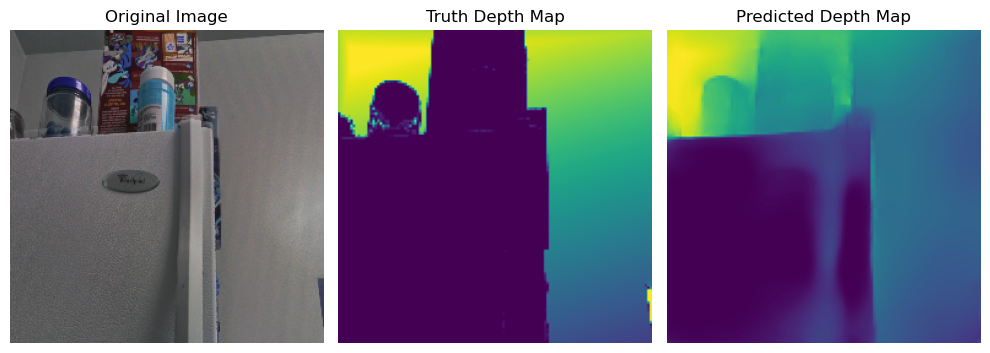

1/1 [==============================] - 0s 15ms/step


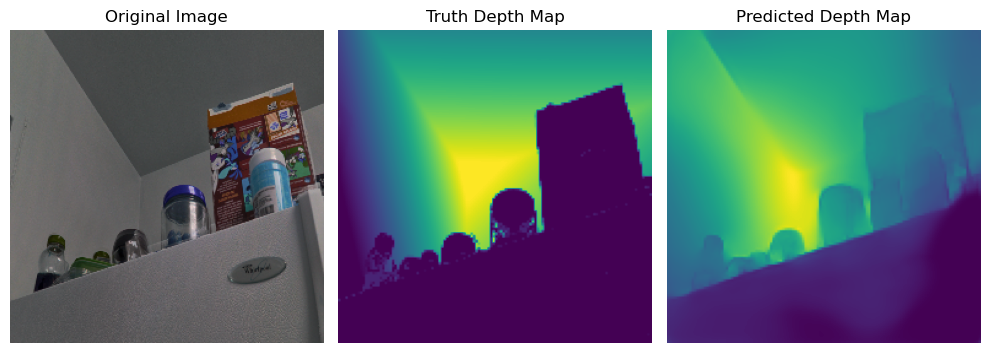

1/1 [==============================] - 0s 15ms/step


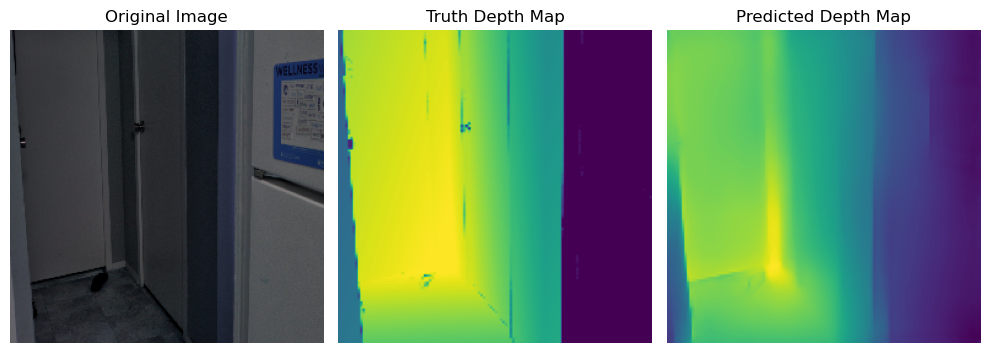

1/1 [==============================] - 0s 16ms/step


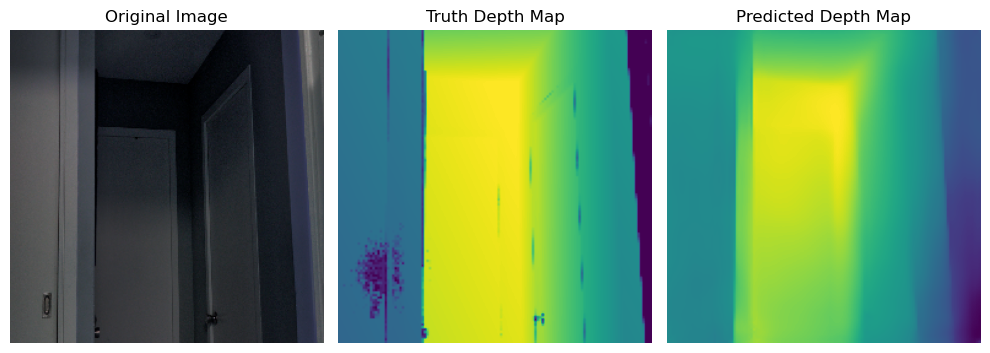

1/1 [==============================] - 0s 15ms/step


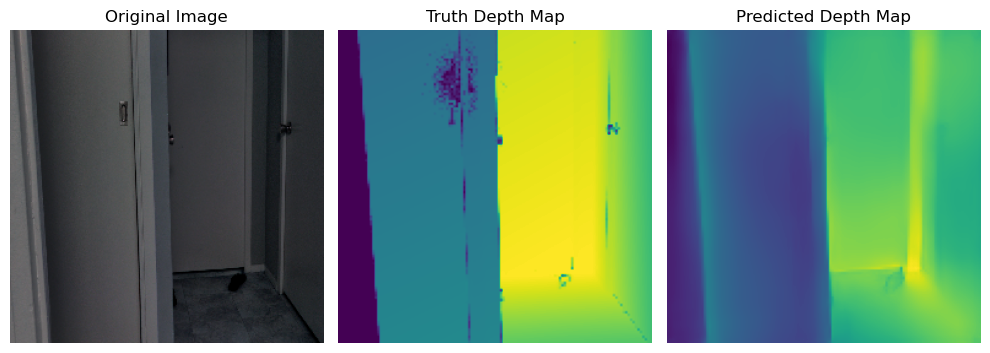

1/1 [==============================] - 0s 17ms/step


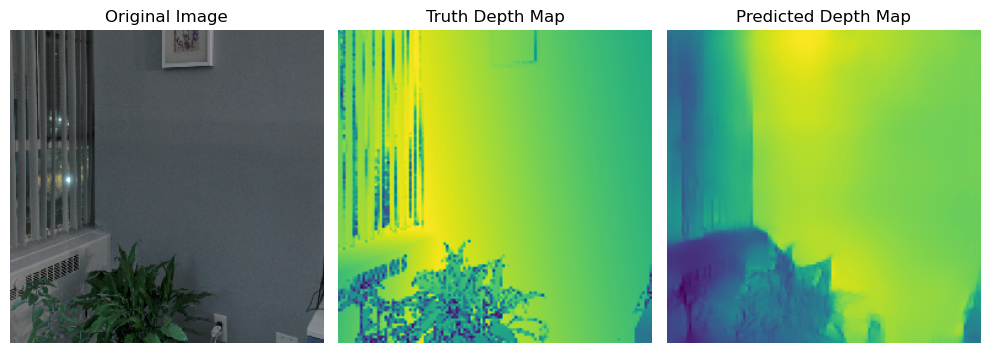

1/1 [==============================] - 0s 17ms/step


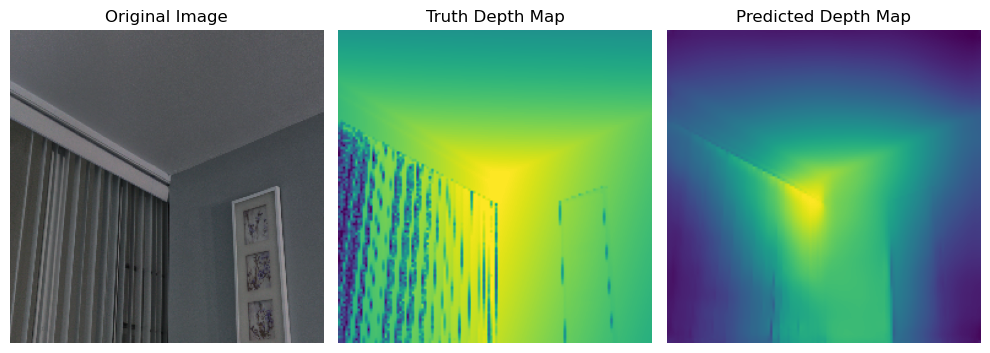

1/1 [==============================] - 0s 17ms/step


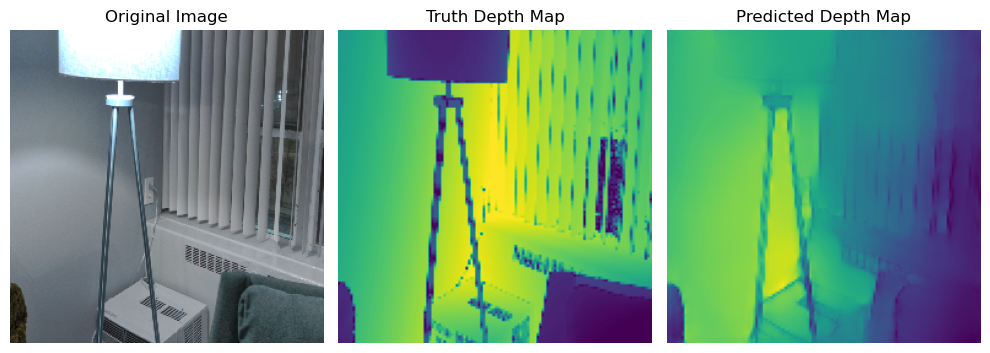

1/1 [==============================] - 0s 19ms/step


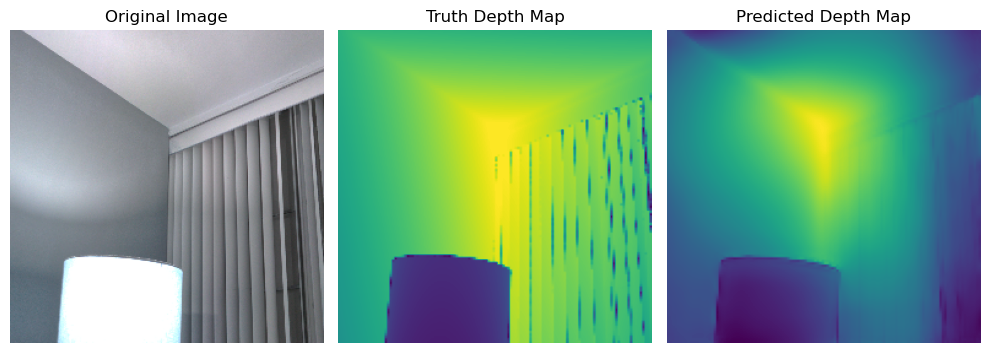

1/1 [==============================] - 0s 16ms/step


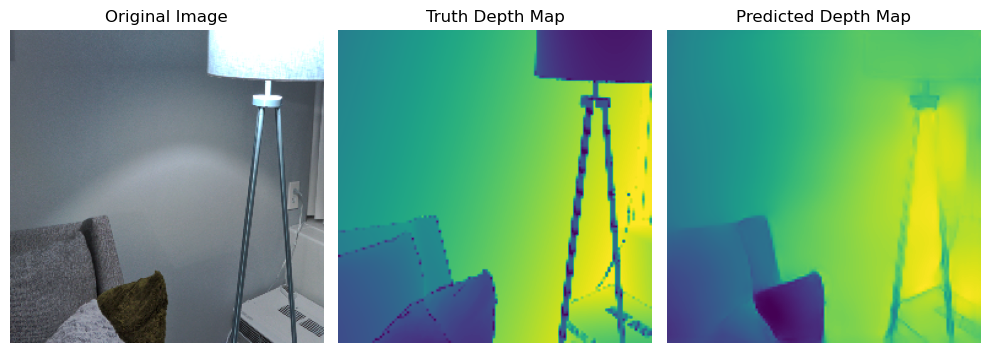

1/1 [==============================] - 0s 15ms/step


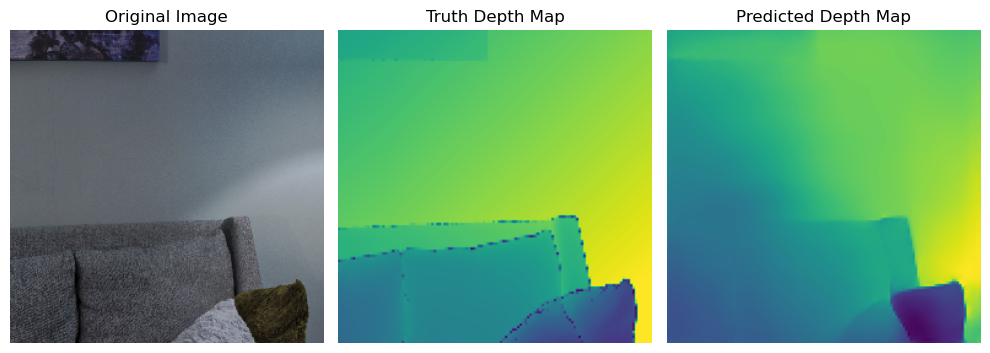

1/1 [==============================] - 0s 15ms/step


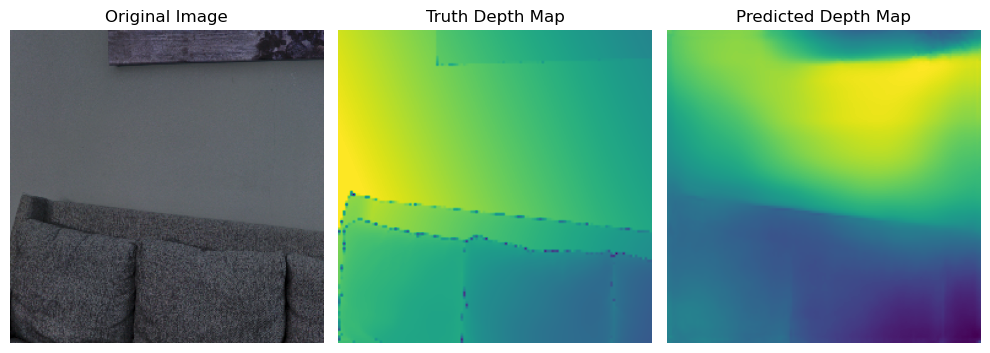

1/1 [==============================] - 0s 15ms/step


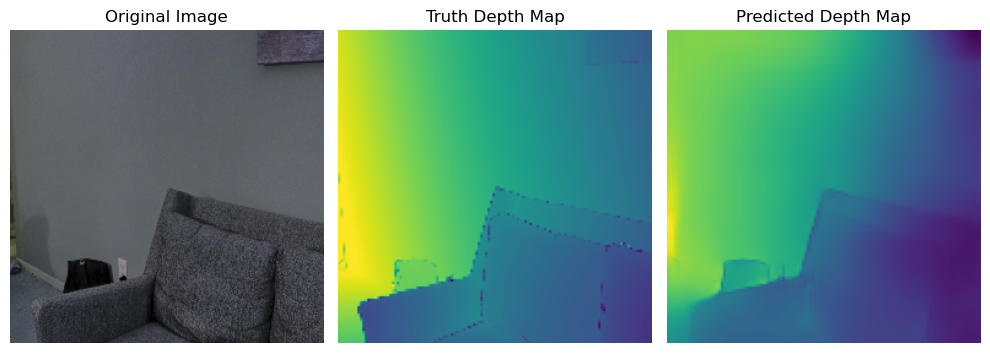

1/1 [==============================] - 0s 15ms/step


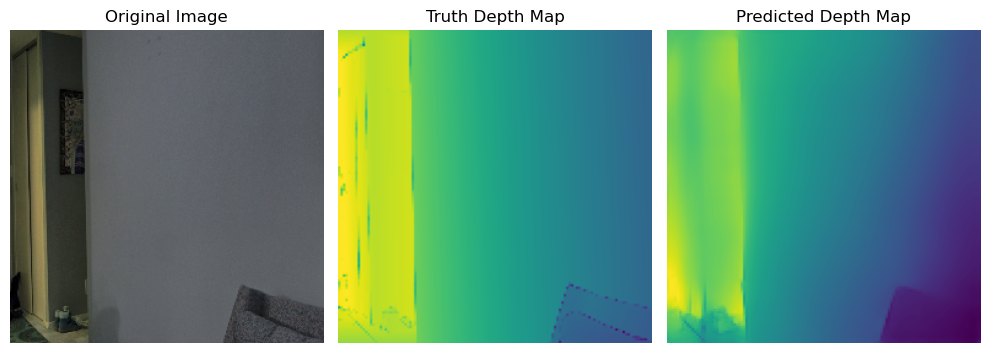

1/1 [==============================] - 0s 16ms/step


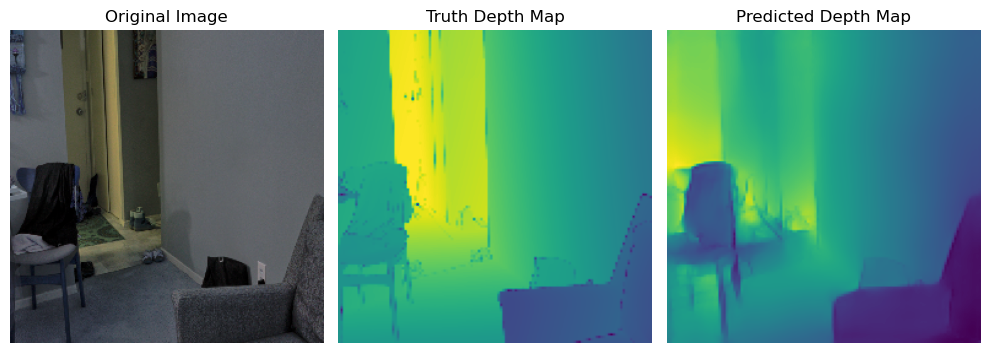

1/1 [==============================] - 0s 18ms/step


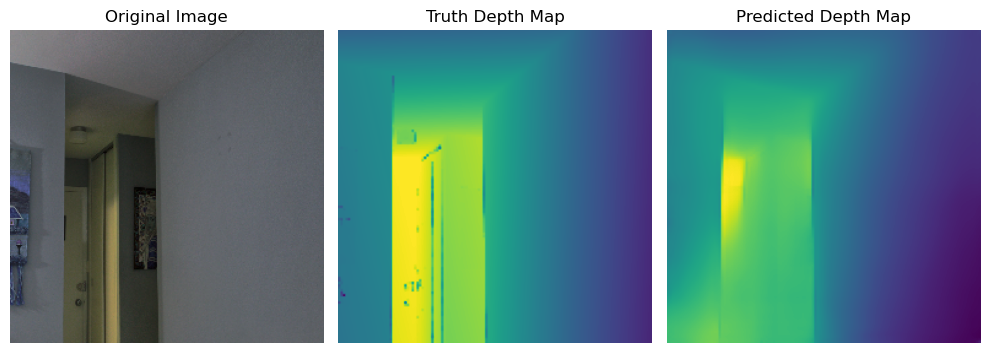

1/1 [==============================] - 0s 16ms/step


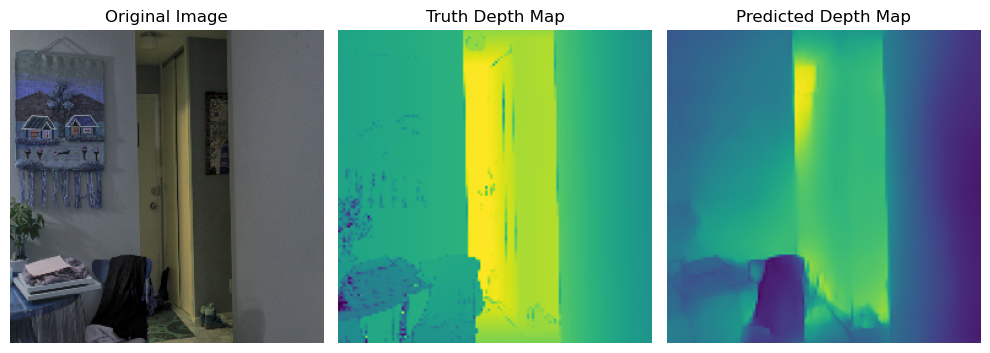

1/1 [==============================] - 0s 16ms/step


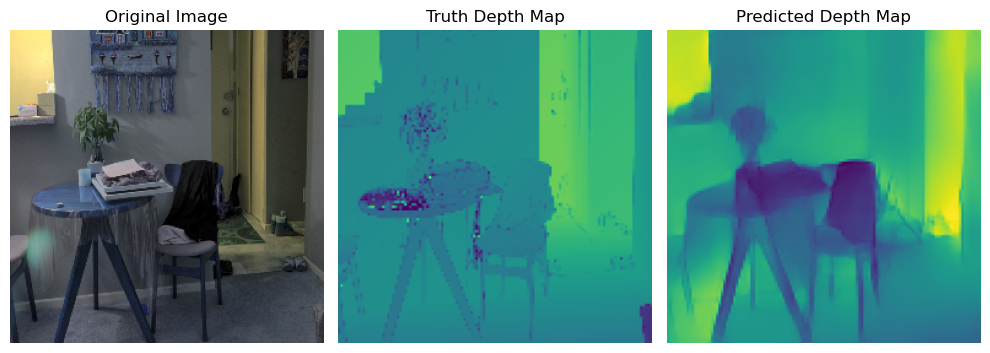

1/1 [==============================] - 0s 17ms/step


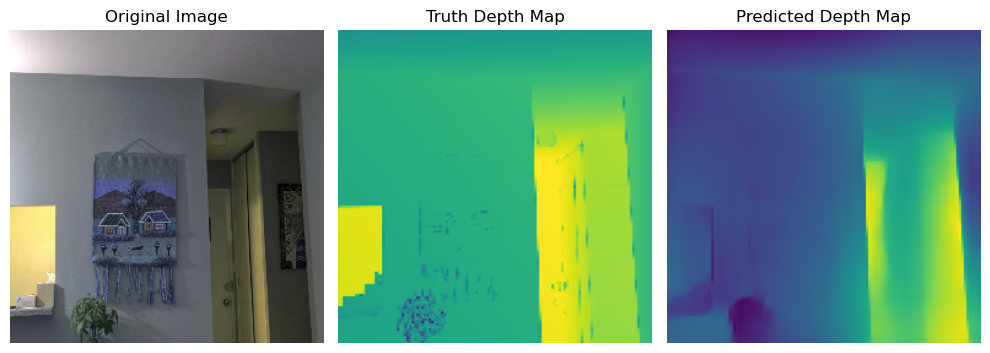

1/1 [==============================] - 0s 17ms/step


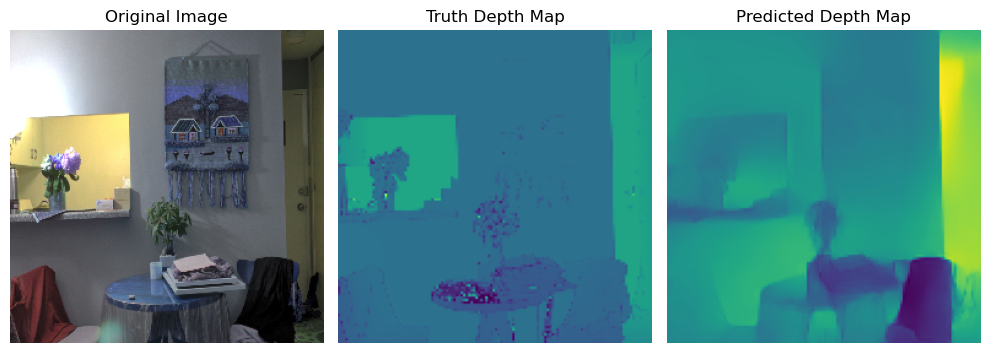

1/1 [==============================] - 0s 15ms/step


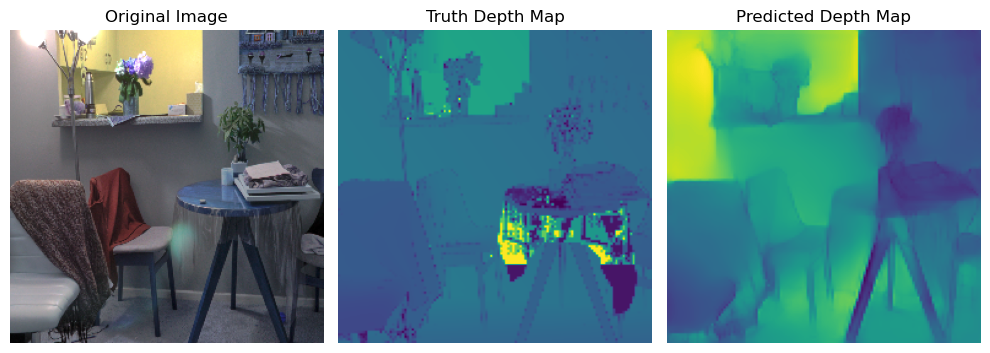

1/1 [==============================] - 0s 17ms/step


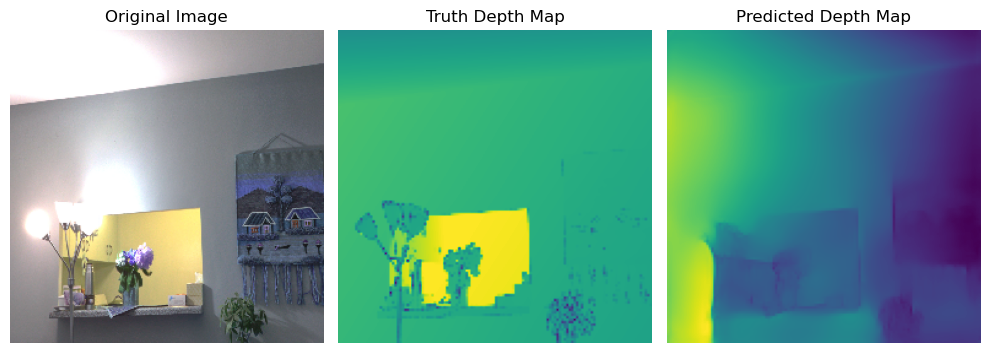

1/1 [==============================] - 0s 18ms/step


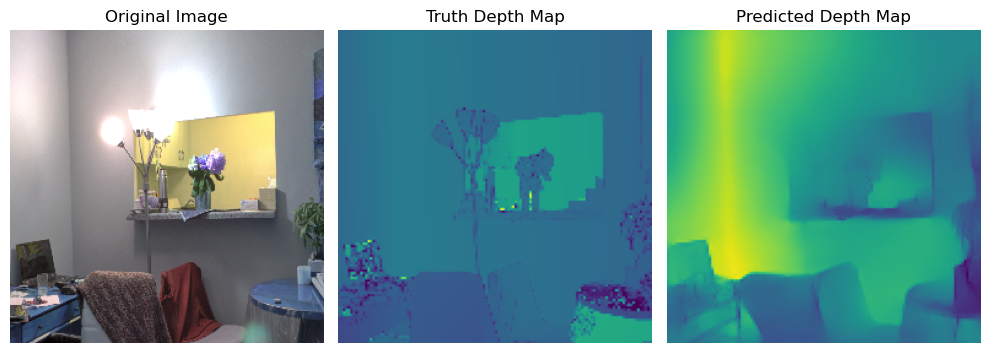

1/1 [==============================] - 0s 17ms/step


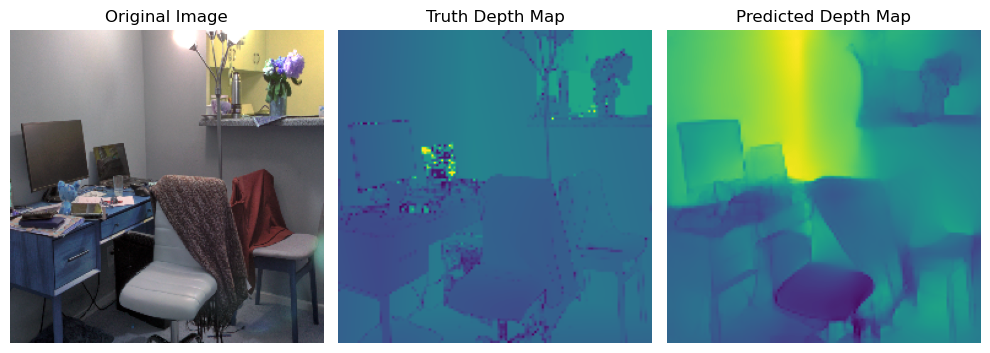

1/1 [==============================] - 0s 15ms/step


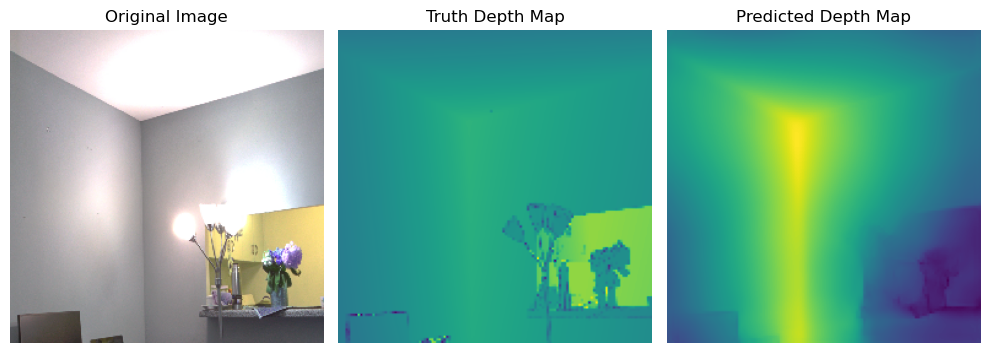

1/1 [==============================] - 0s 21ms/step


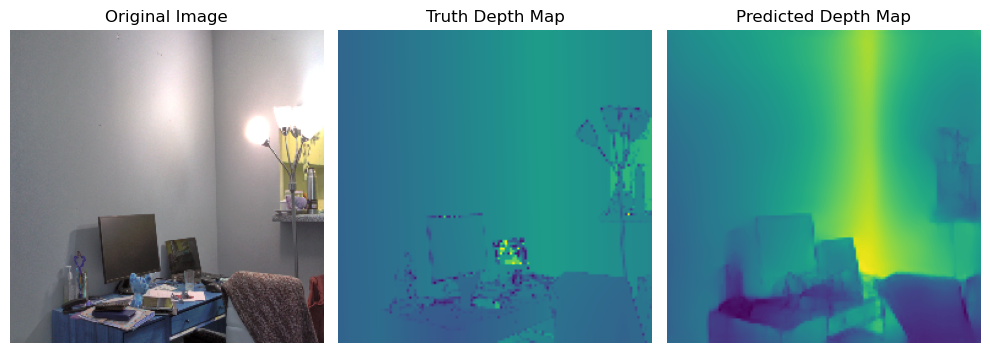

1/1 [==============================] - 0s 17ms/step


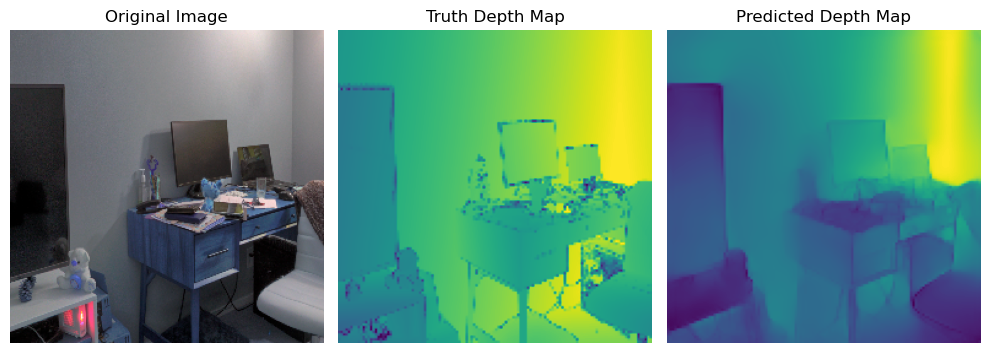

1/1 [==============================] - 0s 18ms/step


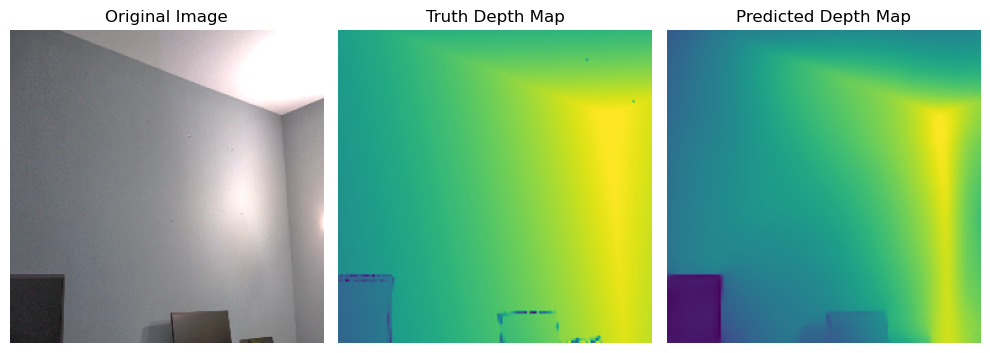

1/1 [==============================] - 0s 18ms/step


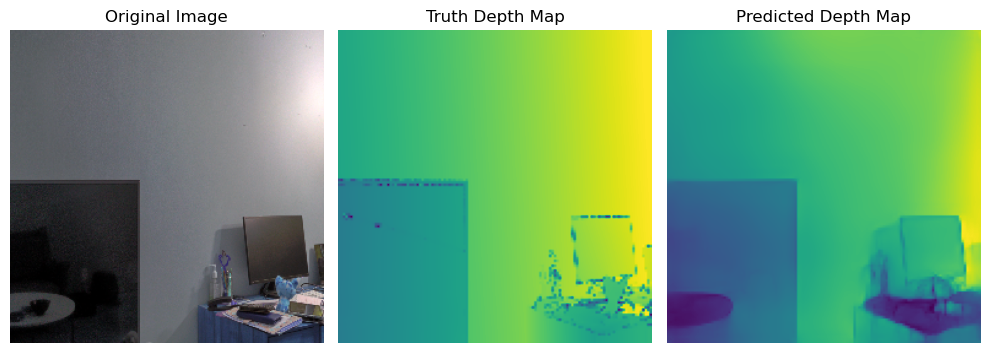

1/1 [==============================] - 0s 18ms/step


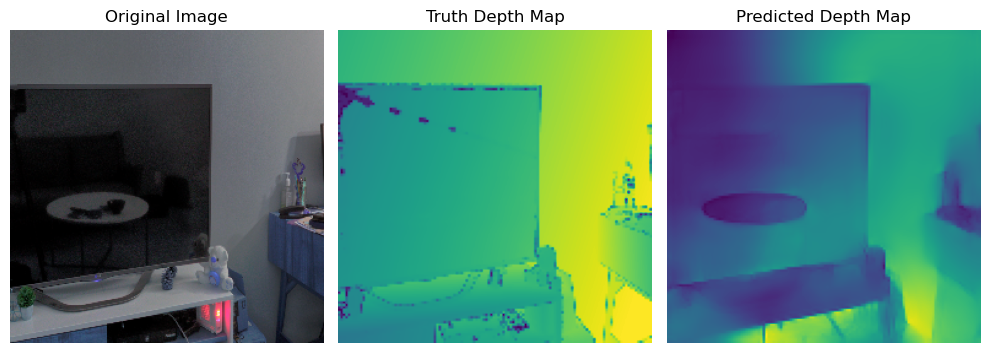

In [ ]:


num_tests = 50
custom_data_generator = CustomDataGenerator(split="val", scene_types=scene_type, meta_fname=meta_fname, data_root=data_root, batch_size=1, dim=dim)

# Load and predict images one by one
for i in range(num_tests):
    _, axs = plt.subplots(nrows=1, ncols=3, figsize=(10, 20))  # Adjust as needed


    x, y = custom_data_generator.load(i+108)
    
    x = np.expand_dims(x, axis=0)

    # Predict depth map
    y_pred = model.predict(x)

    # Plot original image, truth depth map, and predicted depth map using matplotlib
    axs[0].imshow(x[0])
    axs[0].set_title('Original Image')
    axs[1].imshow(y)
    axs[1].set_title('Truth Depth Map')
    axs[2].imshow(y_pred[0, :, :, 0])
    axs[2].set_title('Predicted Depth Map')

    # Remove axis for all subplots
    for ax in axs.flat:
        ax.axis('off')

    plt.tight_layout()
    plt.show()